# Process

Define the process here

In [46]:
import numpy as np
import pandas as pd
from sqlalchemy import create_engine
from tensorflow import keras
from tensorflow.keras import layers
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

%matplotlib inline
sns.set(rc={"figure.figsize": (26, 10)})

In [11]:
sys.path.append("../")
from cnrdlib import cl_eda as cle

In [12]:
engine = create_engine(f"sqlite:///../data/RawData.db")
df_all = pd.read_sql_table("SensorData_5min", con=engine, index_col="timestamp")
df_all.head()

,WIP_temp,DP_temp,Ext_temp,WIP_current,DP_current
timestamp,,,,,
2021-03-30 00:00:00,4.828750,3.028125,17.063750,5.881250,9.741250
2021-03-30 00:05:00,4.299444,3.080000,17.474444,6.122778,9.839444
2021-03-30 00:10:00,4.506471,2.900588,17.605882,5.895000,9.783750
2021-03-30 00:15:00,4.075000,3.020000,17.395000,5.597059,9.704118
2021-03-30 00:20:00,4.044118,3.010000,17.536471,5.254118,8.987647


In [4]:
df_all.columns

Index(['WIP_temp', 'DP_temp', 'Ext_temp', 'WIP_current', 'DP_current'], dtype='object')

In [5]:
df = df_all.drop(['DP_temp', 'Ext_temp', 'WIP_current', 'DP_current'], axis=1)
df.head()

,WIP_temp
timestamp,
2021-03-30 00:00:00,4.828750
2021-03-30 00:05:00,4.299444
2021-03-30 00:10:00,4.506471
2021-03-30 00:15:00,4.075000
2021-03-30 00:20:00,4.044118


In [13]:
cle.plot_timeseries_plotly(df, ["WIP_temp"])

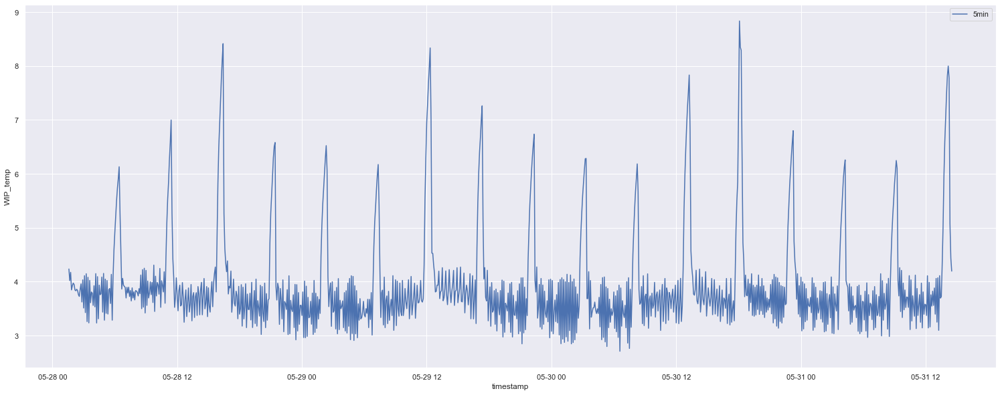

In [20]:
#filter_5min = (df.index > '2021-05-15') & (df.index < '2021-05-16')
filter_5min = (df.index > '2021-05-28 1:30') & (df.index < '2021-05-31 14:35')
sns.lineplot(x=df.index[filter_5min], y="WIP_temp", data=df[filter_5min], label="5min");

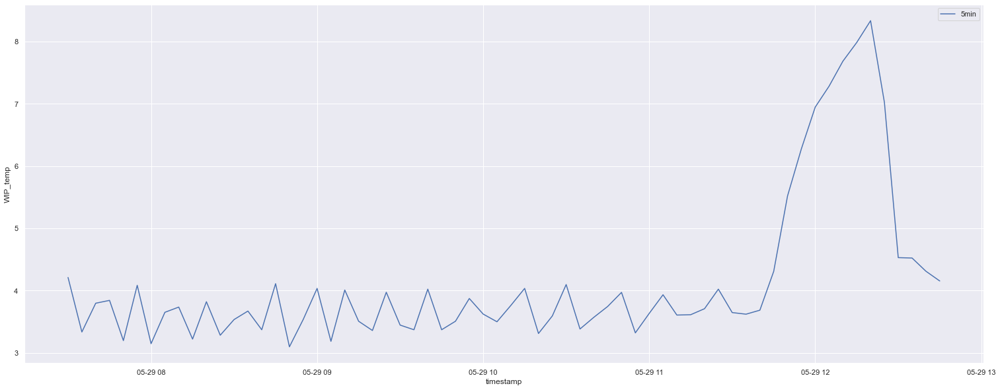

In [28]:
filter_cycle = (df.index > '2021-05-29 07:25') & (df.index < '2021-05-29 12:50')
sns.lineplot(x=df.index[filter_cycle], y="WIP_temp", data=df[filter_cycle], label="5min");

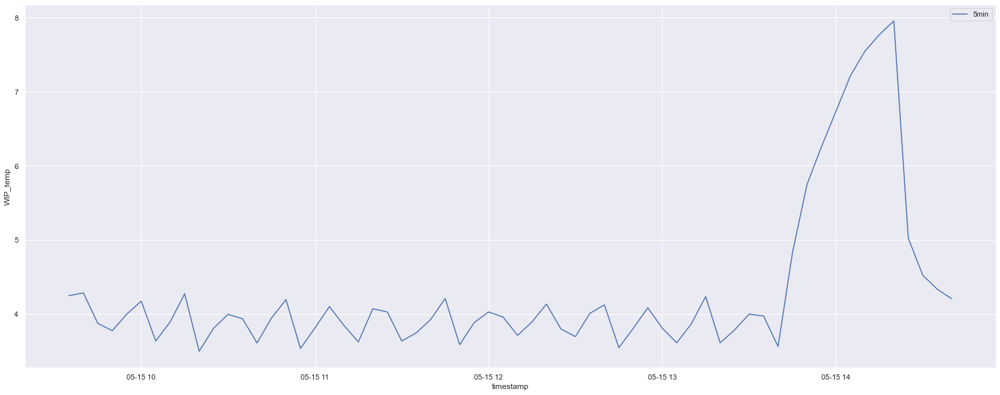

In [81]:
filter_cycle = (df.index > '2021-05-15 09:30') & (df.index < '2021-05-15 14:45')
sns.lineplot(x=df.index[filter_cycle], y="WIP_temp", data=df[filter_cycle], label="5min");

In [82]:
len(df[filter_cycle])
#59

62

In [83]:
# Normalize and save the mean and std we get,
# for normalizing test data.
df_train = df[filter_5min]
training_mean = df_train.mean()
training_std = df_train.std()
df_training_value = (df_train - training_mean) / training_std
print("Number of training samples:", len(df_training_value))

Number of training samples: 1020


In [93]:
TIME_STEPS = 64

# Generated training sequences for use in the model.
def create_sequences(values, time_steps=TIME_STEPS):
    output = []
    for i in range(len(values) - time_steps + 1):
        output.append(values[i : (i + time_steps)])
    return np.stack(output)


x_train = create_sequences(df_training_value.values)
print("Training input shape: ", x_train.shape)

Training input shape:  (957, 64, 1)


In [94]:
model = keras.Sequential(
    [
        layers.Input(shape=(x_train.shape[1], x_train.shape[2])),
        layers.Conv1D(
            filters=32, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Dropout(rate=0.2),
        layers.Conv1D(
            filters=16, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Conv1DTranspose(
            filters=16, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Dropout(rate=0.2),
        layers.Conv1DTranspose(
            filters=32, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Conv1DTranspose(filters=1, kernel_size=7, padding="same"),
    ]
)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss="mse")
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_8 (Conv1D)            (None, 32, 32)            256       
_________________________________________________________________
dropout_8 (Dropout)          (None, 32, 32)            0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 16, 16)            3600      
_________________________________________________________________
conv1d_transpose_12 (Conv1DT (None, 32, 16)            1808      
_________________________________________________________________
dropout_9 (Dropout)          (None, 32, 16)            0         
_________________________________________________________________
conv1d_transpose_13 (Conv1DT (None, 64, 32)            3616      
_________________________________________________________________
conv1d_transpose_14 (Conv1DT (None, 64, 1)            

In [95]:
history = model.fit(
    x_train,
    x_train,
    epochs=100,
    batch_size=128,
    validation_split=0.15,
    callbacks=[
        keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, mode="min")
    ],
)

Epoch 1/100
7/7 [==============================] - 1s 31ms/step - loss: 0.9632 - val_loss: 0.6513
Epoch 2/100
7/7 [==============================] - 0s 13ms/step - loss: 0.7697 - val_loss: 0.4923
Epoch 3/100
7/7 [==============================] - 0s 13ms/step - loss: 0.5110 - val_loss: 0.3476
Epoch 4/100
7/7 [==============================] - 0s 14ms/step - loss: 0.3361 - val_loss: 0.2356
Epoch 5/100
7/7 [==============================] - 0s 14ms/step - loss: 0.2611 - val_loss: 0.1901
Epoch 6/100
7/7 [==============================] - 0s 13ms/step - loss: 0.2337 - val_loss: 0.1846
Epoch 7/100
7/7 [==============================] - 0s 14ms/step - loss: 0.2131 - val_loss: 0.1769
Epoch 8/100
7/7 [==============================] - 0s 14ms/step - loss: 0.2054 - val_loss: 0.1728
Epoch 9/100
7/7 [==============================] - 0s 13ms/step - loss: 0.1961 - val_loss: 0.1638
Epoch 10/100
7/7 [==============================] - 0s 14ms/step - loss: 0.1908 - val_loss: 0.1630
Epoch 11/100
7/7 [=

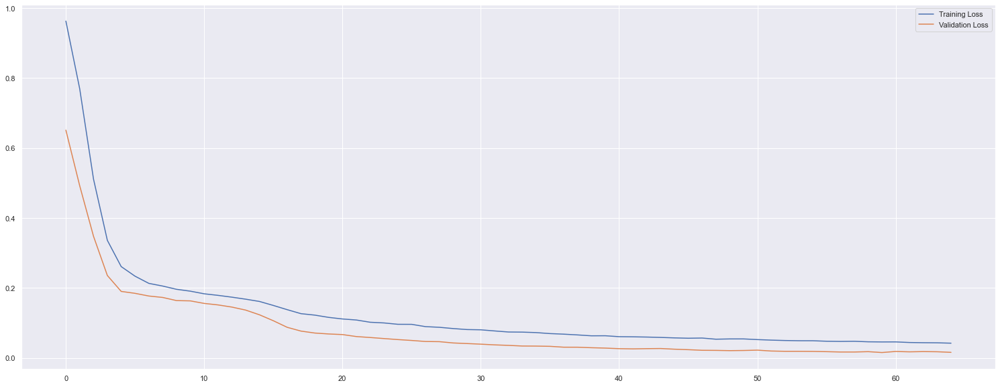

In [96]:
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.show()

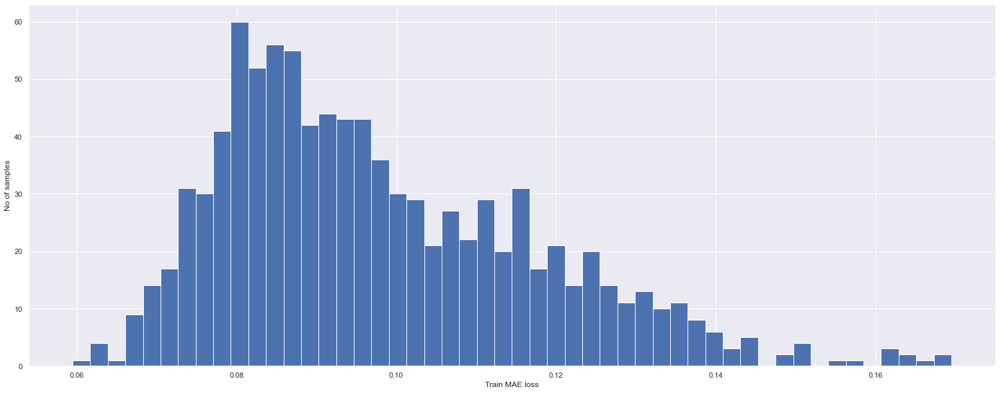

Reconstruction error threshold:  0.18645411261154216


In [97]:
# Get train MAE loss.
x_train_pred = model.predict(x_train)
train_mae_loss = np.mean(np.abs(x_train_pred - x_train), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel("Train MAE loss")
plt.ylabel("No of samples")
plt.show()

# Get reconstruction loss threshold.
threshold = np.max(train_mae_loss)*1.1
print("Reconstruction error threshold: ", threshold)

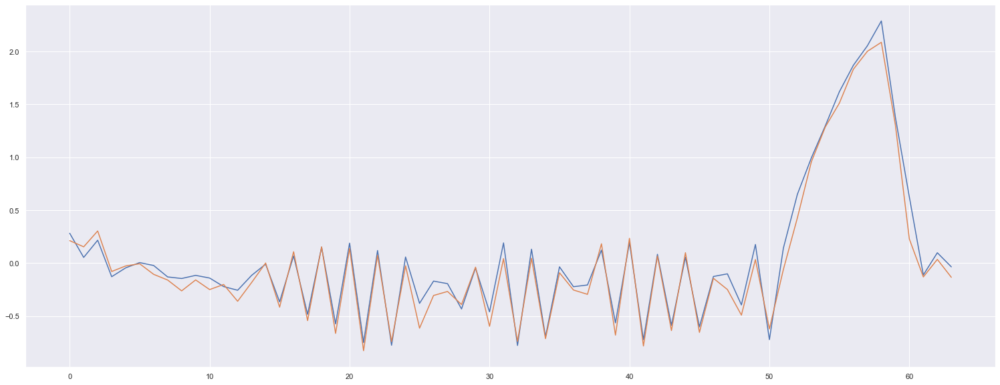

In [98]:
# Checking how the first sequence is learnt
plt.plot(x_train[0])
plt.plot(x_train_pred[0])
plt.show()

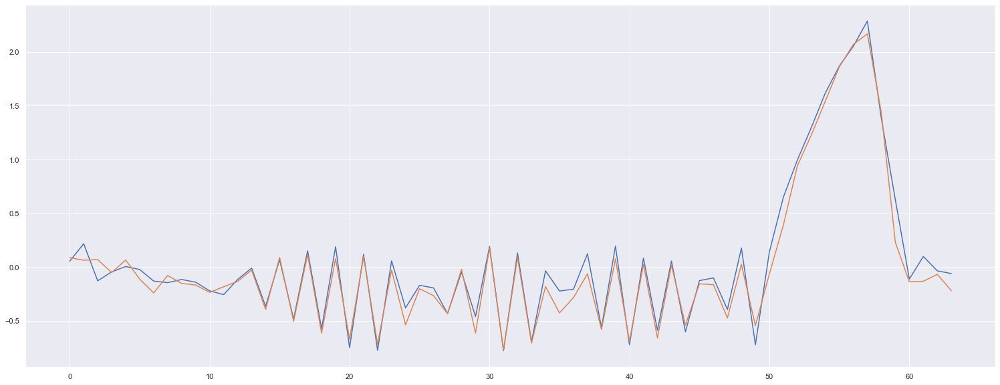

In [99]:
# Checking how the first sequence is learnt
plt.plot(x_train[1])
plt.plot(x_train_pred[1])
plt.show()

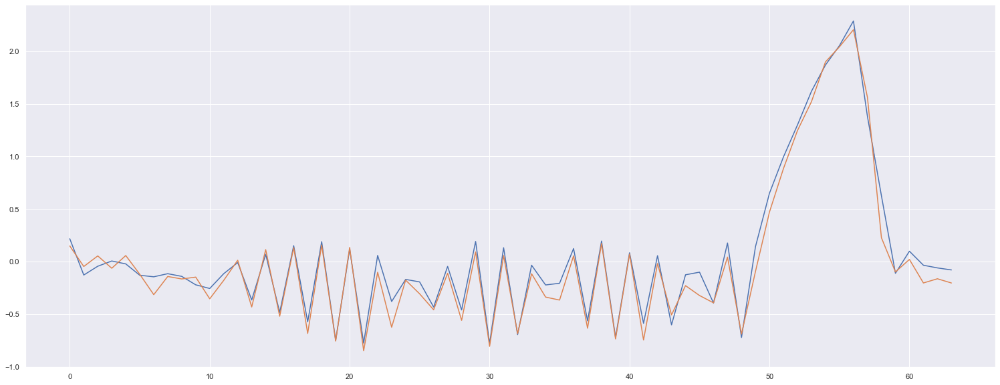

In [100]:
# Checking how the first sequence is learnt
plt.plot(x_train[2])
plt.plot(x_train_pred[2])
plt.show()

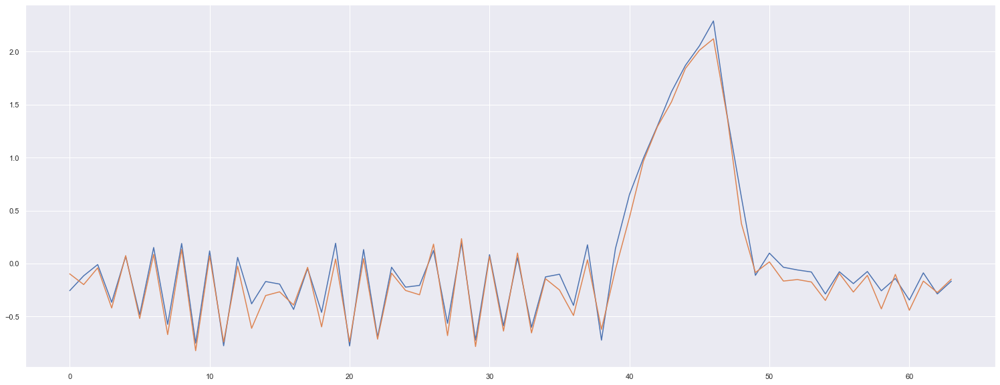

In [101]:
# Checking how the first sequence is learnt
plt.plot(x_train[12])
plt.plot(x_train_pred[12])
plt.show()

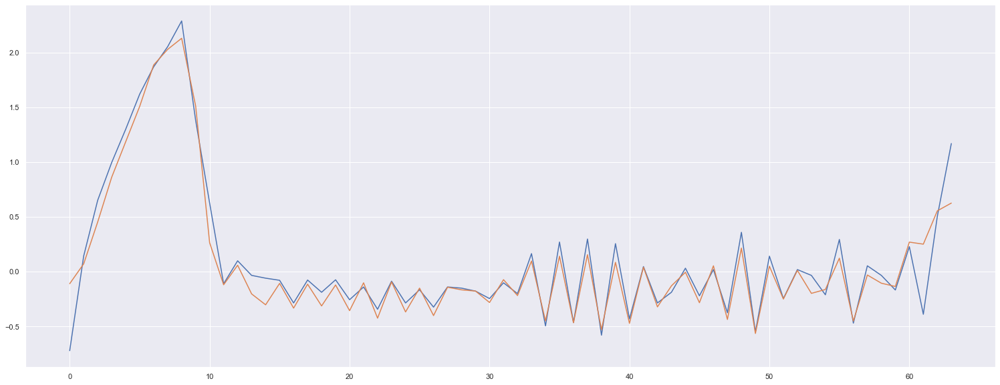

In [102]:
# Checking how the first sequence is learnt
plt.plot(x_train[50])
plt.plot(x_train_pred[50])
plt.show()

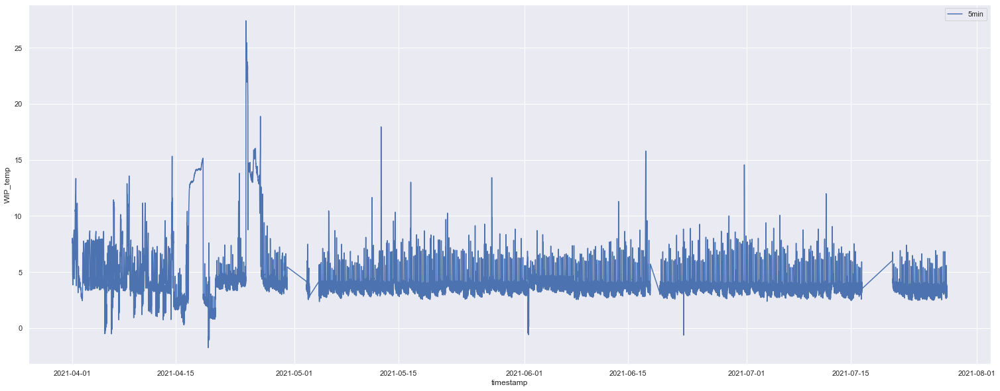

In [62]:
filter_anomaly = (df.index > '2021-04-01') & (df.index < '2021-07-30')
sns.lineplot(x=df.index[filter_anomaly], y="WIP_temp", data=df[filter_anomaly], label="5min");

In [63]:
df_anomaly = df[filter_anomaly]
df_anomaly.head()

,WIP_temp
timestamp,
2021-04-01 00:05:00,7.584706
2021-04-01 00:10:00,7.633333
2021-04-01 00:15:00,7.720000
2021-04-01 00:20:00,7.788235
2021-04-01 00:25:00,7.853333


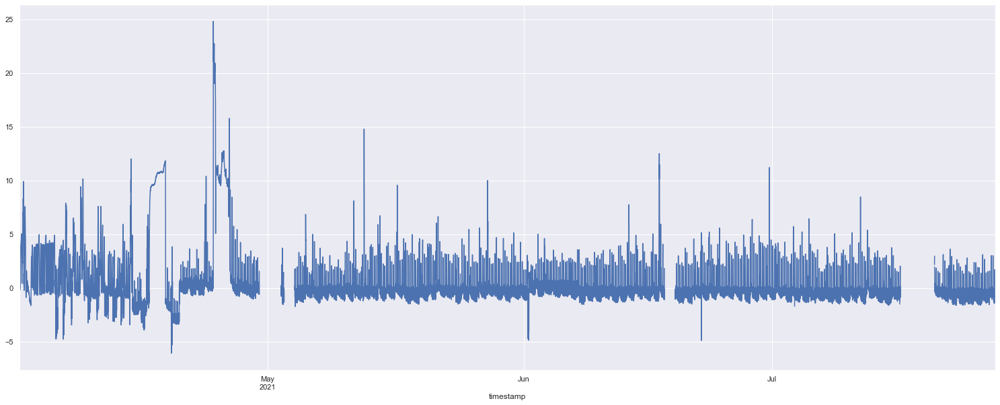

Test input shape:  (33920, 64, 1)


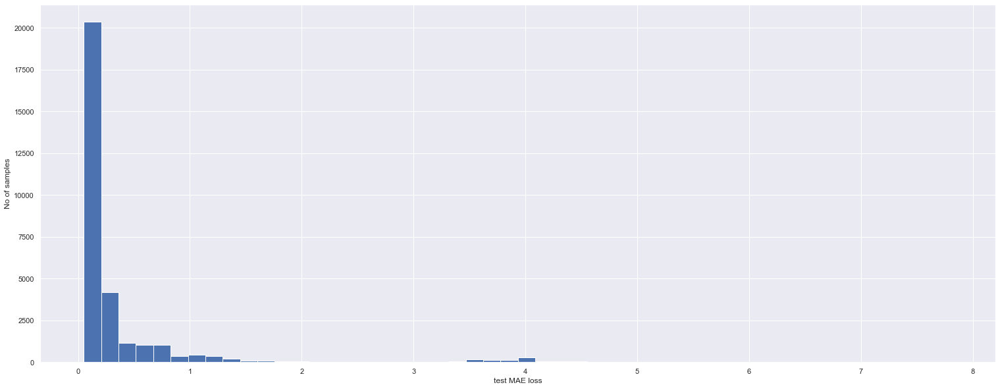

Number of anomaly samples:  11890


In [103]:
df_test_value = (df_anomaly - training_mean) / training_std
fig, ax = plt.subplots()
df_test_value.plot(legend=False, ax=ax)
plt.show()

# Create sequences from test values.
x_test = create_sequences(df_test_value.values)
print("Test input shape: ", x_test.shape)

# Get test MAE loss.
x_test_pred = model.predict(x_test)
test_mae_loss = np.mean(np.abs(x_test_pred - x_test), axis=1)
test_mae_loss = test_mae_loss.reshape((-1))

plt.hist(test_mae_loss, bins=50)
plt.xlabel("test MAE loss")
plt.ylabel("No of samples")
plt.show()

# Detect all the samples which are anomalies.
anomalies = test_mae_loss > threshold
print("Number of anomaly samples: ", np.sum(anomalies))
# print("Indices of anomaly samples: ", np.where(anomalies))

In [120]:
# data i is an anomaly if samples [(i - timesteps + 1) to (i)] are anomalies
anomalous_data_indices = []
for data_idx in range(TIME_STEPS - 1, len(df_test_value) - TIME_STEPS + 1):
    if np.all(anomalies[data_idx - TIME_STEPS + 1 : data_idx]):
        anomalous_data_indices.append(data_idx)

In [121]:
df_subset = df_anomaly.iloc[anomalous_data_indices]
df_subset.shape

(7530, 1)

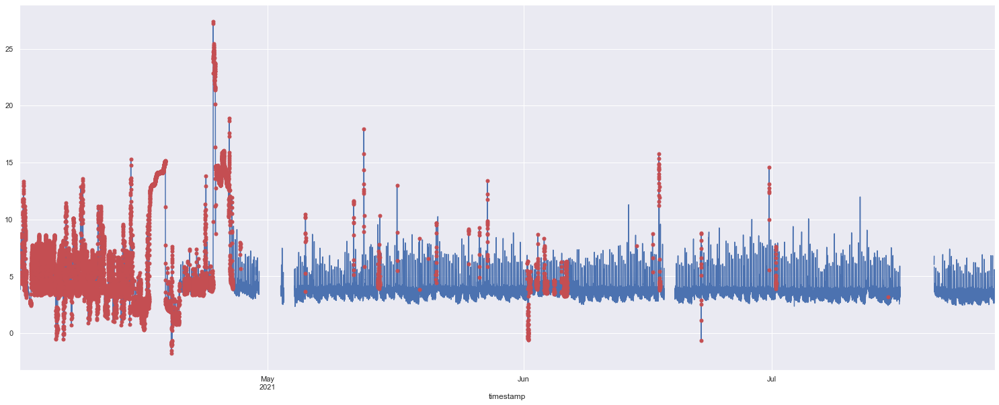

In [122]:
fig, ax = plt.subplots()
df_anomaly.plot(legend=False, ax=ax)
df_subset.plot(legend=False, ax=ax, color="r", marker="o", markersize=5, linewidth=0)
plt.show()

In [123]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_anomaly.index, y=df_anomaly.WIP_temp, mode='lines', name='trend'))
fig.add_trace(go.Scatter(x=df_subset.index, y=df_subset.WIP_temp, mode='markers', name='anomalies'))
fig.show()